In [1]:
%pylab inline
import os
from pycupid import clumpfind
import haloSim
import ipyvolume as ipv
import ipyvolume.pylab as pvlt
import astropy.io.fits as pyfits

from configparser import ConfigParser
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTask
#important constant
C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc

Populating the interactive namespace from numpy and matplotlib


In [2]:
cd wrkDir/sim/HSC-like-sim/

/work/xiangchong.li/work/massMapSparse/sim/HSC-like-sim


In [3]:
# Simulation
iz  =   3
im  =   6

log_m_array=np.linspace(13.5,15.5,9)
z_array=np.linspace(0.01,1.01,9)
names=('iz','im','zh','log10_M200','conc','rs_arcmin')
data=[]
z_h=z_array[iz]
log_m=log_m_array[im]
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo =   haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
print('redshift is %.2f' %z_h)
print('logM is %.2f' %log_m)

redshift is 0.39
logM is 15.00


In [4]:
# Pixelation
ver='pix10-nl20'
zer='pz'
hdir='./pixelize-equalNum-%s/' %ver
odir='./reconstruct-%s' %ver
configName  =   'config-%s.ini' %ver
parser      =   ConfigParser()
parser.read(configName)

outfname1   =  os.path.join(hdir,'pixShearR-g1-%d-%d-%s-wn.fits' %(iz,im,zer))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d-%d-%s-wn.fits' %(iz,im,zer))
outfname3   =  os.path.join(hdir,'pixStd.fits')
outfname4   =  os.path.join(hdir,'lensing_kernel-%s.fits' %zer)
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)
parser.set('file','outDir',odir)
parser.set('lensZ','zmin','0.05')
parser.set('lensZ','zscale','0.05')
parser.set('lensZ','nlp','15')

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))

gridInfo    =   cartesianGrid3D(parser)

ngroup  =   100
infname =   'sims/stampSim-HSC_like-TJ03-%d,%d-202004021856.fits' %(iz,im)
datTab  =   pyfits.getdata(infname)
ng=len(datTab)//ngroup
ig=0
datU=datTab[ig*ng:(ig+1)*ng]

if not os.path.isfile(outfname1):
    print('preparing the pixelation file')
    g1name  =   'g1R'
    g2name  =   'g2R'
    raname  =   'raR'
    decname =   'decR'
    if '-zt' in outfname1:
        zname   =   'ztrue'
    elif '-pz' in outfname1:
        zname   =   'zbest'
    if '-nn' in outfname1:
        val=(datU[g1name])+(datU[g2name])*1j
    elif '-wn' in outfname1:
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
    outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
    pyfits.writeto(outfname1,outcome.real,overwrite=True)
    pyfits.writeto(outfname2,outcome.imag,overwrite=True)
    
dtheta=parser.getfloat('transPlane','scale')*60. #arcsec
print('rs of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta))
print('r truncate of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta*halo.c))
print('the average density contrast should be %.3f.' %(halo.M/(halo.rs/halo.c)**2./np.pi/halo.Sigma_M_bin(0.51,0.56)))
# lensing kernel
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    datDir='/work/xiangchong.li/work/S16ACatalogs/'
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    if zer=='pz':
        lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best)
    elif zer=='zt':
        lensKernel= gridInfo.lensing_kernel()
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
    
## Noise variance
if not os.path.isfile(outfname3):
    print('preparing the noise std file')
    ngroup=100
    pixDatAll=np.zeros((ngroup,)+gridInfo.shape,dtype=np.complex128)
    for ig in range(ngroup):
        datU=datTab[ig*ng:(ig+1)*ng]
        g1name  =   'g1R'
        g2name  =   'g2R'
        raname  =   'raR'
        decname =   'decR'
        zname   =   'zbest'
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
        outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
        pixDatAll[ig]=outcome
    pixSigmaErr=np.std(pixDatAll,axis=0)
    outfname3   =  os.path.join(hdir,'pixStd.fits')
    pyfits.writeto(outfname3,pixSigmaErr,overwrite=True)

1.5
./pixelize-equalNum-pix10-nl20/pixShearR-g2-3-6-pz-wn.fits
rs of the input halo is 1.848 pixels.
r truncate of the input halo is 6.464 pixels.
the average density contrast should be 3.792.


In [5]:
# Reconstruction Init
tau=0.
parser.set('sparse','lbd','5.' )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','1' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTask(parser)
if False:
    toPlot=sparse3D.diagonal[0,0]
    normL=np.sum(sparse3D.lensKernel**2.,axis=0)[0]
    print(normL)
    #Spectrum
    hist=plt.hist(toPlot.flatten(),bins=40)
    print(np.median(toPlot.flatten()))
    print(np.average(toPlot.flatten()))
if False:
    sparse3D.sigmaSInv=  np.zeros(sparse3D.shapeS)
    sparse3D.sigmaSInv[sparse3D.mask]=  1.

    sparse3D.lensKernel=np.ones((sparse3D.nz,sparse3D.nlp))
    sparse3D.fast_chi2diagonal_est()
    toPlot=sparse3D.diagonal[0,1]
    normL=np.sum(sparse3D.lensKernel**2.,axis=0)[0]
    print(normL)
    #Spectrum
    hist=plt.hist(toPlot.flatten()/normL,bins=40)
    print(np.median(toPlot.flatten()/normL))
    print(np.average(toPlot.flatten()/normL))
    print(toPlot[int(sparse3D.ny/2),int(sparse3D.nx/2)])
if False:
    hist=plt.hist(sparse3D.sigmaA.flatten(),bins=40)
    print(np.median(sparse3D.sigmaA.flatten()))
    print(np.average(sparse3D.sigmaA.flatten()))
if False:
    hist=plt.hist(sparse3D.sigmaS.flatten(),bins=40,range=(0.,1e-1))
    print(np.median(sparse3D.sigmaS.flatten()))
    print(np.average(sparse3D.sigmaS.flatten()))

1.0036601178276805


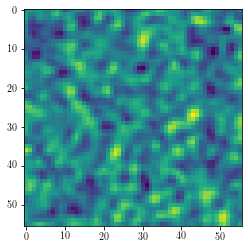

In [56]:
# Ensure the noise on model space is normalized for each zlens bin
ishow=1
toshow=sparse3D.sigmaA[ishow,0,20:76,20:76]
plt.imshow(toshow)
print(np.average(toshow))

0.0023177164325703984


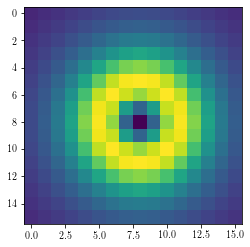

In [57]:
# Ensure the projectors are normalized
ishow=1
a=np.zeros(sparse3D.shapeA)
a[ishow,0,48,48]=1
a2=sparse3D.main_forward(a)
alphaRSim=  np.abs(a2)
toshow=alphaRSim[ishow,40:56,40:56]
plt.imshow(toshow)
print(np.sum(alphaRSim**2.))

0.002311792993563698


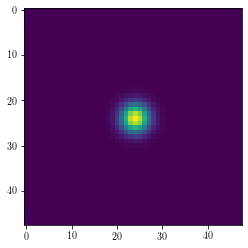

In [58]:
#Correlations of the projectors
ishow=0
b=sparse3D.chi2_transpose(a2)
toshow=b[ishow,0,24:72,24:72]
plt.imshow(toshow)
print(toshow.max())

3.903904037261248e-05


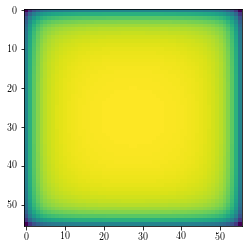

In [9]:
ishow=1
toshow=sparse3D.diagonal[ishow,0,20:76,20:76]
plt.imshow(toshow)
print(toshow.min())

53.09488423281592
5.104173031975149
8.33366181074271


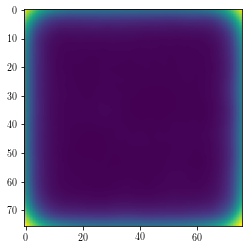

In [19]:
ishow=14
toshow=sparse3D._w[ishow,0,10:86,10:86]
plt.imshow(toshow)
print(toshow.max())
print(np.average(sparse3D._w[:,0,20:76,20:76]))
print(np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.)

shape of lensing kernel:  (10, 15) = (10, 15)
0.004584748891245386 0.00458360424650228 1.0002497259103422
0.006970427739914738 0.006968925512790236 1.0002155607950962
0.00887971026319581 0.008864788010180728 1.0016833175252409
0.010398349073952024 0.01031819297998722 1.0077684236106335
0.011523679370005247 0.011374910324982017 1.013078700470851
0.012281156978974077 0.012083200617536191 1.0163827753675292
0.012730103261728349 0.012504355496509785 1.0180535306503062
0.012945814983619254 0.012683855281431154 1.0206530030795606
0.012959049003204834 0.012654377124994379 1.0240764025918494
0.012813080182107675 0.012447981037615474 1.0293299888061318


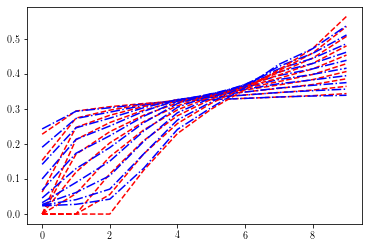

In [66]:
lk1=gridInfo.lensing_kernel()
lk2=sparse3D.lensKernel
print('shape of lensing kernel: ',lk1.shape,'=',lk2.shape)
for izl in range(0,10):
    norm1=np.sqrt(np.sum(lk1[:,izl]**2.))
    norm2=np.sqrt(np.sum(lk2[:,izl]**2.))
    print(norm1,norm2,norm1/norm2)
    plt.plot(lk1[:,izl]/norm1,'--',c='red')
    plt.plot(lk2[:,izl]/norm2,'-.',c='blue')

0.225 0.135


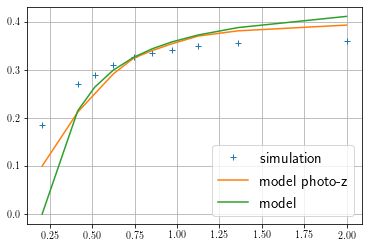

In [67]:
izl=3
halo=haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
#SigmaArray=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
lensKer= halo.lensKernel(datU['ztrue'])
kerzshow=np.zeros(gridInfo.nz)
for i in range(gridInfo.nz):
    mask=(datU['zbest']>gridInfo.zbound[i])&(datU['zbest']<=gridInfo.zbound[i+1])
    kerzshow[i]=np.average(halo.M*lensKer[mask])
norm1=np.sqrt(np.sum(kerzshow**2.))
norm2=np.sqrt(np.sum(lk1[:,izl]**2.))
norm3=np.sqrt(np.sum(lk2[:,izl]**2.))
plt.plot(gridInfo.zcgrid,kerzshow/norm1,'+',label='simulation')
plt.plot(gridInfo.zcgrid,lk2[:,izl]/norm2,label='model photo-z')
plt.plot(gridInfo.zcgrid,lk1[:,izl]/norm3,label='model')
plt.grid()
plt.legend(fontsize=15,loc='lower right')
print(sparse3D.zlBin[izl],z_h)

# sparse analysis

In [6]:
sparse3D.process(1000)

In [10]:
if True:
    p=np.zeros(sparse3D.shapeA)
    ss=sparse3D.alphaR*sparse3D._w

    for iz in range(sparse3D.nlp):
        for ifr in range(sparse3D.nframe):
            if ifr==0:
                rsmth=int(3**(1.-iz/10.)+0.5)
            else:
                rsmth=1
            for jsh in range(-rsmth,rsmth+1):
                dif    =   np.roll(ss[iz,ifr],jsh,axis=-2)
                for ish in range(-rsmth,rsmth+1):
                    dif2=   np.roll(dif,ish,axis=-1)
                    p[iz,ifr] += dif2/(2.*rsmth+1.)**2.
    p=np.abs(p)
    ratio=np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.
    p=p/sparse3D._w*ratio

    thres_adp=1./1e10
    mask=(p>thres_adp)

    w=np.zeros(sparse3D.shapeA)
    w[mask]=1./(p[mask])**(1.)
    w[~mask]=1./thres_adp
    sparse3D.fista_gradient_descent(800,w=w)
else:
    p=np.zeros(sparse3D.shapeA)
    ss=sparse3D.alphaR*sparse3D._w

    rsmth=1
    num=0.
    for jsh in range(-rsmth,rsmth+1):
        dif    =   np.roll(ss,jsh,axis=-2)
        for ish in range(-rsmth,rsmth+1):
            dif2=   np.roll(dif,ish,axis=-1)
            p +=dif2
            num+=1
    p=np.abs(p/num)
    ratio=np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.
    p=p/sparse3D._w*ratio

    thres_adp=1./1e10
    mask=(p>thres_adp)

    w=np.zeros(sparse3D.shapeA)
    w[mask]=1./(p[mask])**(1.)
    w[~mask]=1./thres_adp
    sparse3D.fista_gradient_descent(800,w=w)

In [183]:
sparse3D.reconstruct()
ipv.figure()
vol1=ipv.volshow(sparse3D.deltaR,level=[0.95,0.70,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.01,1.01]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

3.8518442524112873
-3.532368856256711e-06
3.8518442524112873
0.7500000000000001 0.8000000000000002
709556619.1878979
1.8960783710291457e-16
54.45443680714401


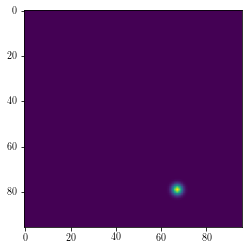

In [182]:
ishow=14
plt.imshow(sparse3D.deltaR[ishow])
print(np.abs(sparse3D.deltaR[ishow]).max())
print(sparse3D.deltaR[ishow].min())
print(sparse3D.deltaR[ishow].max())
zav=sparse3D.zlBin[ishow]
zmin=zav-sparse3D.zlscale/2.
zmax=zav+sparse3D.zlscale/2.
print(zmin,zmax)
pix_mpc=halo.cosmo.Da(0.,0.51)*1./60./180.*np.pi
print(halo.Sigma_M_bin(0.50,0.55)*np.sum(sparse3D.deltaR[ishow][24:72,24:72])*pix_mpc**2.)
print(np.average(sparse3D.deltaR[ishow][44:52,44:52]))
print(np.sum(sparse3D.deltaR[ishow]))

In [195]:
import detect3D
data=sparse3D.deltaR
detect3D.local_maxima_3D(data)

(array([[ 7, 48, 47],
        [ 8, 42, 47],
        [14, 79, 67]]),
 array([32.08775535, 12.51445833,  3.85184425]))

In [ ]:
# Three ways to get the correaltion of basis vector
ii1=7
ii2=3
ind1=sparse3D.ind1list[ii1]
ind2=sparse3D.ind1list[ii2]
print(sparse3D.get_basis_cov(ind1,ind2))
print(sparse3D.projCor[ii1,ii2])
print(sparse3D.projCor[ii2,ii1])
ind1=(13,1,71,22)
ind2=(14,2,71,21)
# 1
print(np.sum(np.conjugate(sparse3D.get_basis_vector(ind1))*sparse3D.get_basis_vector(ind2)).real)

# 2
a0=sparse3D.get_basis_vector(ind1)
print(sparse3D.chi2_transpose(a0)[ind2])

# 3
print(sparse3D.get_basis_cov(ind1,ind2))

# spectrum
print(sparse3D.get_basis_cov(ind1,ind1))
print(1./sparse3D.mu0[ind1])

Text(0, 0.5, 'prob')

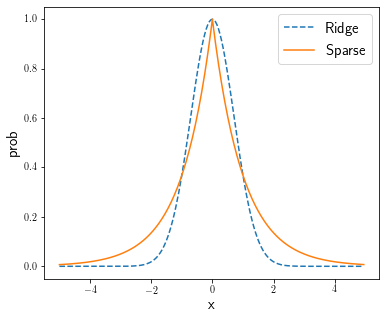

In [53]:
plt.figure(figsize=(6,5))
a=np.arange(-5,5,0.05)
plt.plot(a,np.exp(-a**2.),'--',label='Ridge')
plt.plot(a,np.exp(-np.abs(a)),label='Sparse')
plt.legend(fontsize=15)
plt.xlabel('x',fontsize=15)
plt.ylabel('prob',fontsize=15)

Text(0, 0.5, '$x_2$')

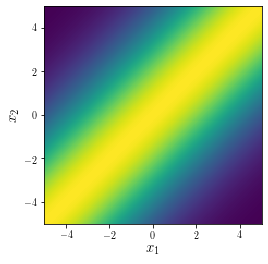

In [69]:
A,B=np.meshgrid(a,a)
C=np.exp(-(A-B)**2./20)
plt.imshow(C,origin='lower',extent=[-5,5,-5,5],interpolation='None')
plt.xlabel(r'$x_1$',fontsize=15)
plt.ylabel(r'$x_2$',fontsize=15)